<a href="https://colab.research.google.com/github/sampriti-mahapatra/multiple-view-geometry/blob/main/MVG_Assignment_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
import numpy as np
import cv2 as cv
import glob
import os

# termination criteria
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

square_size_cm = 2.0

# Prepare object points in centimeters
objp = np.zeros((7*7,3), np.float32)
objp[:,:2] = np.mgrid[0:7,0:7].T.reshape(-1,2) * square_size_cm

objpoints = []
imgpoints = []

# Input/output folders
input_folder = '/content/drive/MyDrive/MVGAssignment1/Images'
output_folder = '/content/drive/MyDrive/MVGAssignment1/Processed_Images'
os.makedirs(output_folder, exist_ok=True)

# Collect images
images = glob.glob(os.path.join(input_folder, '*.jpg'))
print(f"Found {len(images)} images in {input_folder}")

for fname in images:
    img = cv.imread(fname)
    if img is None:
        print(f"⚠️ Could not read {fname}")
        continue

    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    # Find chessboard corners (7x7 inner corners)
    ret, corners = cv.findChessboardCorners(gray, (7,7), None)

    if ret:
        print(f"✅ Corners found in {os.path.basename(fname)}")
        objpoints.append(objp)
        corners2 = cv.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners2)

        # --- Block to print correspondence points for the current image ---
        print(f"--- Correspondences for {os.path.basename(fname)} ---")
        print("   3D Scene Point (cm)      <-->     2D Image Point (pixels)")
        print("---------------------------------------------------------------------")
        # Print first 5 and last 2 points as a sample for brevity
        for i in list(range(5)) + list(range(len(corners2) - 2, len(corners2))):
            scene_pt = objp[i]
            image_pt = np.squeeze(corners2[i])
            scene_pt_str = f"({scene_pt[0]:>5.1f}, {scene_pt[1]:>5.1f}, {scene_pt[2]:.1f})"
            image_pt_str = f"({image_pt[0]:>7.2f}, {image_pt[1]:>7.2f})"
            print(f" {scene_pt_str:<28} <-->  {image_pt_str}")
        print("\n") # Add a newline for better readability

        cv.drawChessboardCorners(img, (7,7), corners2, ret)

        # Save output image
        save_path = os.path.join(output_folder, os.path.basename(fname))
        cv.imwrite(save_path, img)
        print(f"   → Saved to {save_path}")
    else:
        print(f"❌ No corners detected in {os.path.basename(fname)}")
print(f"\nAll processed images saved in: {output_folder}")

Found 11 images in /content/drive/MyDrive/MVGAssignment1/Images
✅ Corners found in img1.jpg
--- Correspondences for img1.jpg ---
   3D Scene Point (cm)      <-->     2D Image Point (pixels)
---------------------------------------------------------------------
 (  0.0,   0.0, 0.0)          <-->  ( 536.73, 1289.38)
 (  2.0,   0.0, 0.0)          <-->  ( 872.90, 1303.80)
 (  4.0,   0.0, 0.0)          <-->  (1208.28, 1312.67)
 (  6.0,   0.0, 0.0)          <-->  (1541.58, 1320.85)
 (  8.0,   0.0, 0.0)          <-->  (1872.86, 1324.78)
 ( 10.0,  12.0, 0.0)          <-->  (2191.52, 3562.97)
 ( 12.0,  12.0, 0.0)          <-->  (2547.46, 3566.69)


   → Saved to /content/drive/MyDrive/MVGAssignment1/Processed_Images/img1.jpg
✅ Corners found in img2.jpg
--- Correspondences for img2.jpg ---
   3D Scene Point (cm)      <-->     2D Image Point (pixels)
---------------------------------------------------------------------
 (  0.0,   0.0, 0.0)          <-->  ( 717.84, 1519.32)
 (  2.0,   0.0, 0.0)    

In [7]:
ret, mtx, dist, rvecs, tvecs = cv.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

In [8]:
print("Camera matrix (intrinsic parameters):")
for row in mtx:
    print("  ".join(["%.4f" % val for val in row]))

Camera matrix (intrinsic parameters):
2963.4374  0.0000  1579.8240
0.0000  3187.6066  2186.9466
0.0000  0.0000  1.0000


In [9]:
print("Distortion coefficients:")
print("  ".join(["%.4f" % val for val in dist.ravel()]))

Distortion coefficients:
0.1834  -0.9057  0.0126  0.0057  1.3099


In [10]:
img = cv.imread('/content/drive/MyDrive/MVGAssignment1/Processed_Images/IMG_20250826_144537025_HDR.jpg')
h,  w = img.shape[:2]
newcameramtx, roi = cv.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))

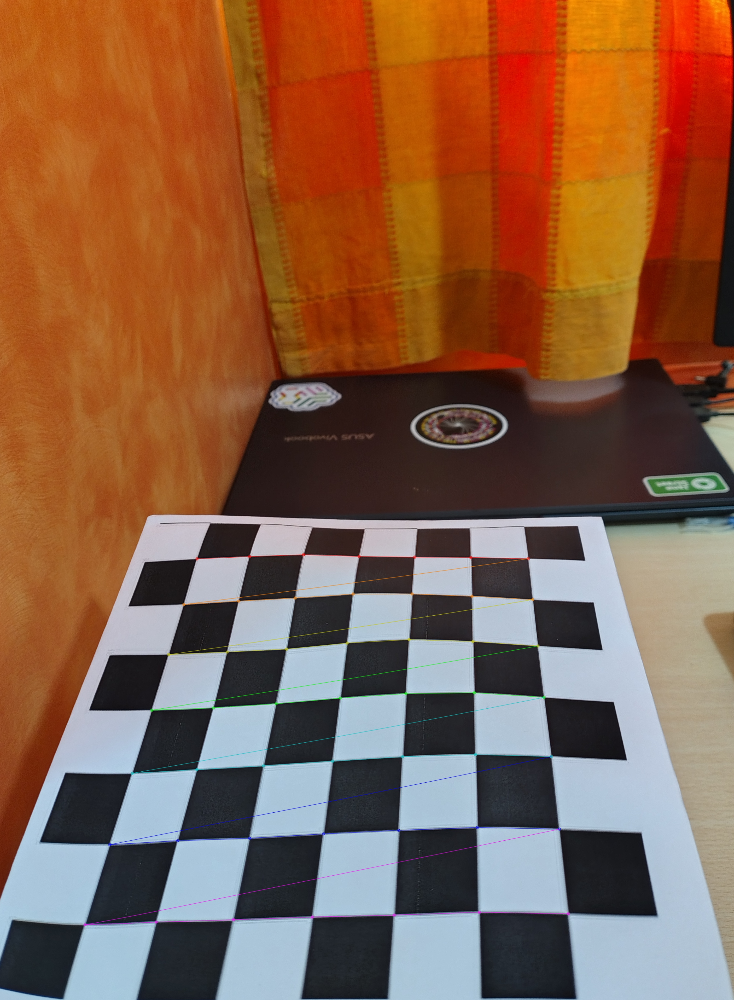

True

In [11]:
# undistort
dst = cv.undistort(img, mtx, dist, None, newcameramtx)

# crop the image
x, y, w, h = roi
dst = dst[y:y+h, x:x+w]

from google.colab.patches import cv2_imshow

# dst = cv.imread('calibresult.png')
# cv2_imshow(dst)
cv2_imshow(dst)   # show undistorted result directly
cv.imwrite('calibresult.png', dst)

In [12]:
mean_error = 0
for i in range(len(objpoints)):
    imgpoints2, _ = cv.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv.norm(imgpoints[i], imgpoints2, cv.NORM_L2)/len(imgpoints2)
    mean_error += error

print(f"\nReprojection Error: {mean_error/len(objpoints):.4f}")


Reprojection Error: 1.6207
